In [1]:
import os
os.environ['R_HOME'] = '/usr/lib/R'
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
from anndata import AnnData
import scanpy as sc
import scvelo as scv

In [86]:
import matplotlib.pyplot as plt
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['font.family'] = ['sans-serif']
plt.rcParams['font.sans-serif'] = ['Arial']

In [2]:
adata=sc.read("adata_velo_all.h5ad")
adata_glia=sc.read("adata_glia.h5ad")

In [3]:
adata=adata[adata_glia.obs_names]
adata.obs.leiden=adata_glia.obs.leiden
adata.obsm=adata_glia.obsm
adata.obsm["X_umap"]=pd.read_csv("UMAP_Glia_mega.csv",index_col=0).loc[adata.obs_names].values
adata.uns['leiden_colors']=adata_glia.uns['leiden_colors']


Trying to set attribute `.obs` of view, copying.


In [4]:
adata

AnnData object with n_obs × n_vars = 2624 × 21246
    obs: 'timeloc', 'batch', 'leiden', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'leiden_colors'
    obsm: 'X_diffusion', 'X_ms_data_gene', 'X_pca', 'X_umap', 'X_umap2'
    layers: 'ambiguous', 'matrix', 'spanning', 'spliced', 'unspliced'

In [5]:
adata._X=adata.X

In [6]:
scv.pp.filter_genes(adata, min_shared_counts=10)
scv.pp.normalize_per_cell(adata)
scv.pp.log1p(adata)
adata.raw=adata
scv.pp.filter_genes_dispersion(adata, n_top_genes=4000)


scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

scv.tl.velocity(adata)

scv.tl.velocity_graph(adata)

Filtered out 990 genes that are detected 10 counts (shared).
Normalized count data: X, spliced, unspliced.
Exctracted 4000 highly variable genes.
computing neighbors
    finished (0:00:03) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:10) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [7]:
adata

AnnData object with n_obs × n_vars = 2624 × 4000
    obs: 'timeloc', 'batch', 'leiden', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'leiden_colors', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_diffusion', 'X_ms_data_gene', 'X_pca', 'X_umap', 'X_umap2'
    layers: 'ambiguous', 'matrix', 'spanning', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_RNA_velo_Glia.png


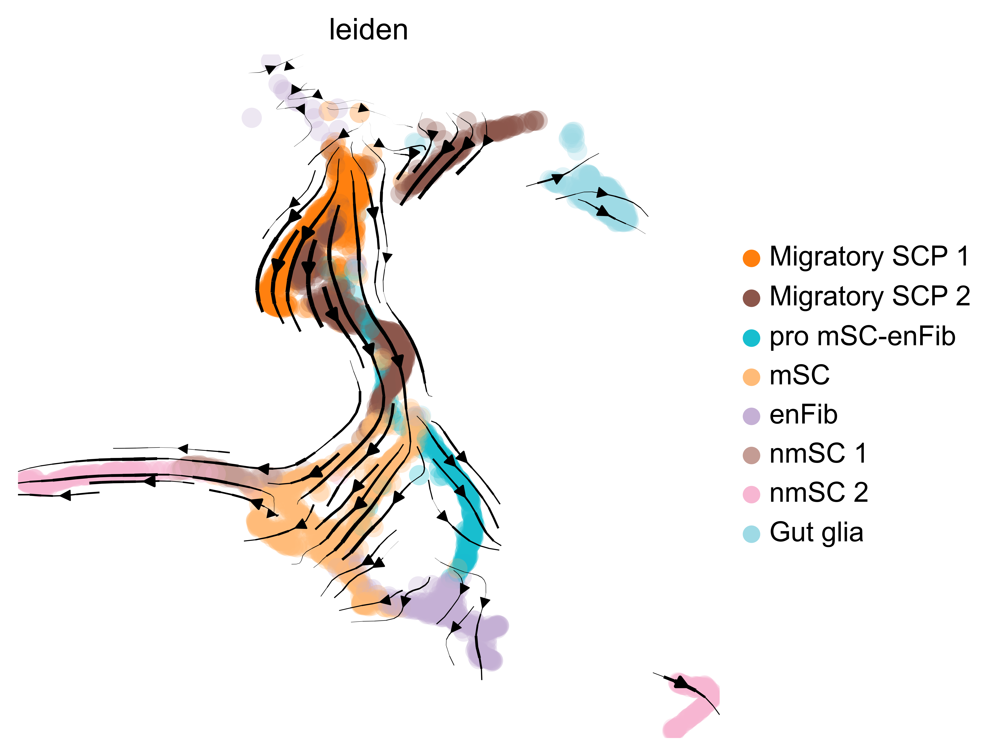

saving figure to file ./figures/scvelo_RNA_velo_Glia_CytoTRACE.png


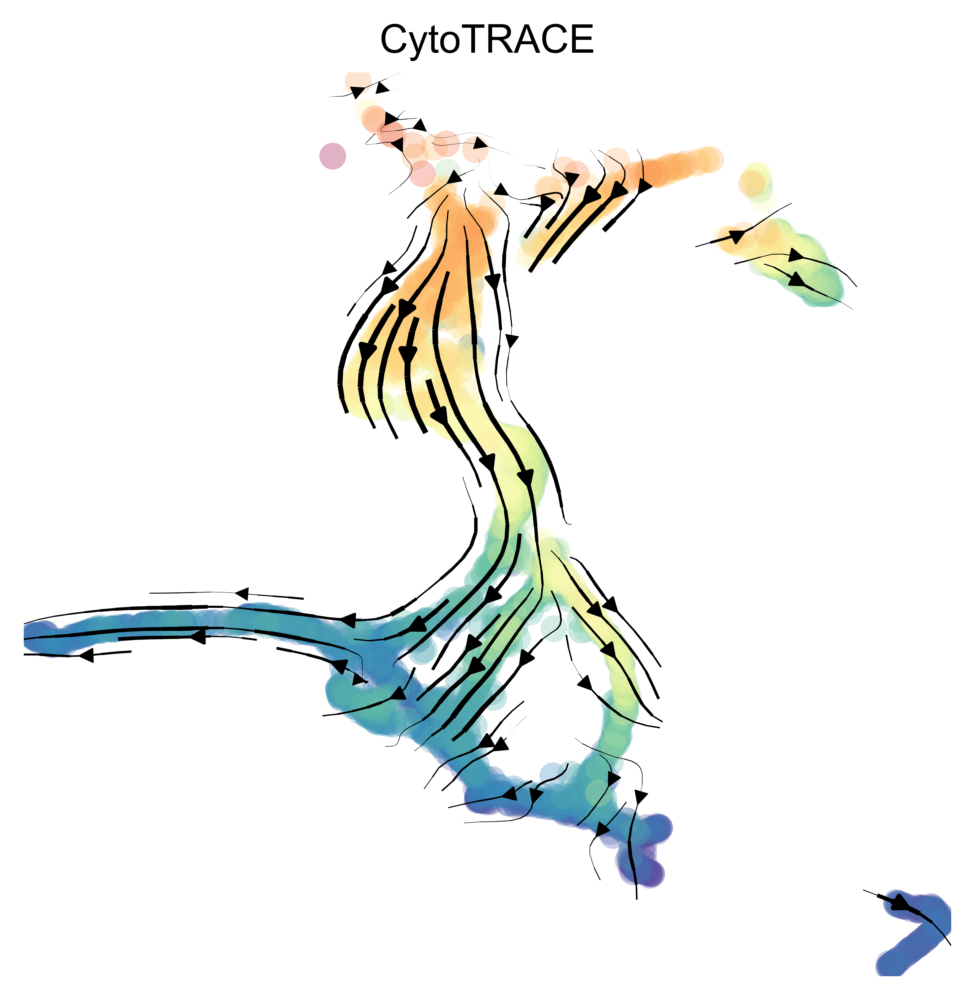

In [8]:
scv.set_figure_params("scvelo",figsize=(5,5))
scv.pl.velocity_embedding_stream(adata, basis='umap',color="leiden",legend_loc="right",
                                save="RNA_velo_Glia.png",dpi=600)

adata.obs["CytoTRACE"]=pd.read_table("megaCytoTRACE_plot_table.txt")["CytoTRACE"][adata.obs_names].values
scv.pl.velocity_embedding_stream(adata, basis='umap',color="CytoTRACE",cmap="Spectral_r",colorbar=False,
                                 save="RNA_velo_Glia_CytoTRACE.png",dpi=600)

In [9]:
import scFates as scf

In [10]:
adata_nogut=adata[~adata.obs.leiden.isin(["Gut glia"])].copy()

In [11]:
scf.tl.tree(adata_nogut,Nodes=100,method="ppt",device="gpu",use_rep="velocity",
            ppt_sigma=.04,ppt_lambda=200,ppt_metric="cosine",seed=1)

inferring a principal tree --> parameters used 
    100 principal points, sigma = 0.04, lambda = 200, metric = cosine
    fitting: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]
    inference not converged (error: 0.010249436636128687)
    finished (0:00:10) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['R'] soft assignment of cells to principal point in representation space.
    .uns['graph']['F'] coordinates of principal points in representation space.


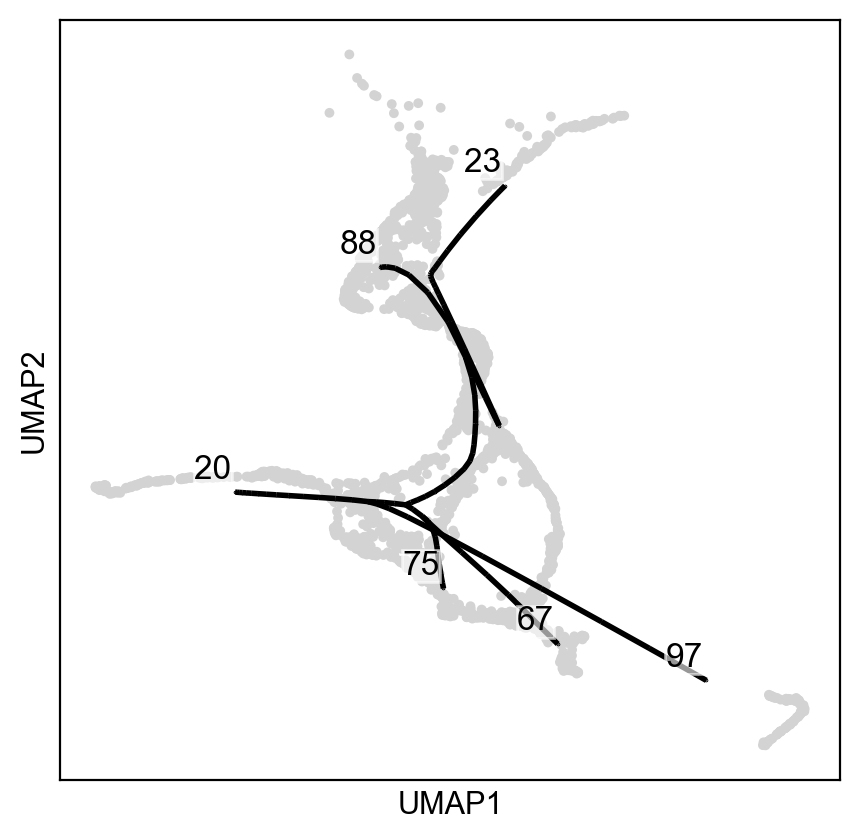

In [12]:
scf.pl.graph(adata_nogut,tips=True,forks=False,size_nodes=0.1)

In [13]:
scf.tl.cleanup(adata_nogut,leaves=[20])

    graph cleaned --> removed 15 principal points


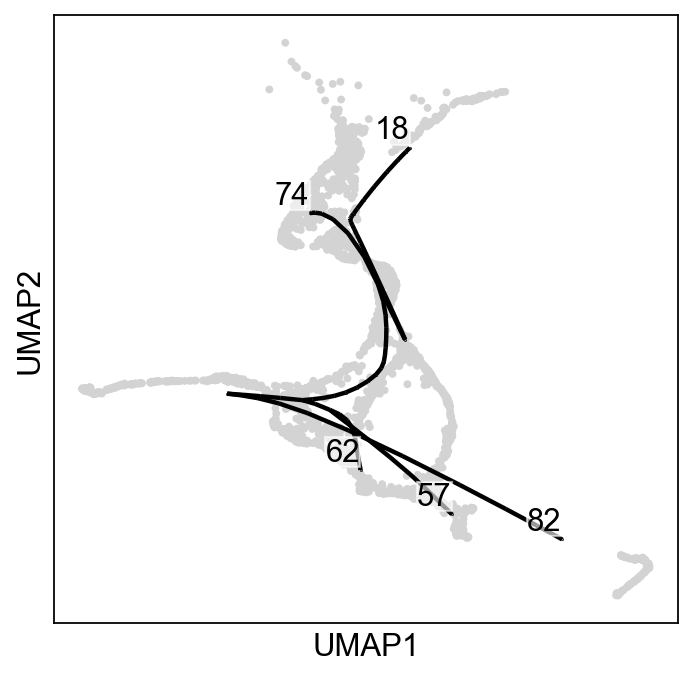

In [14]:
sc.set_figure_params(figsize=(5,5),dpi_save=600)
scf.pl.graph(adata_nogut,tips=True,forks=False,size_nodes=0.1)

In [15]:
scf.tl.root(adata_nogut,74)

root selected --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.


In [16]:
scf.tl.pseudotime(adata_nogut)

projecting cells onto the principal graph
    finished (0:00:00) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.


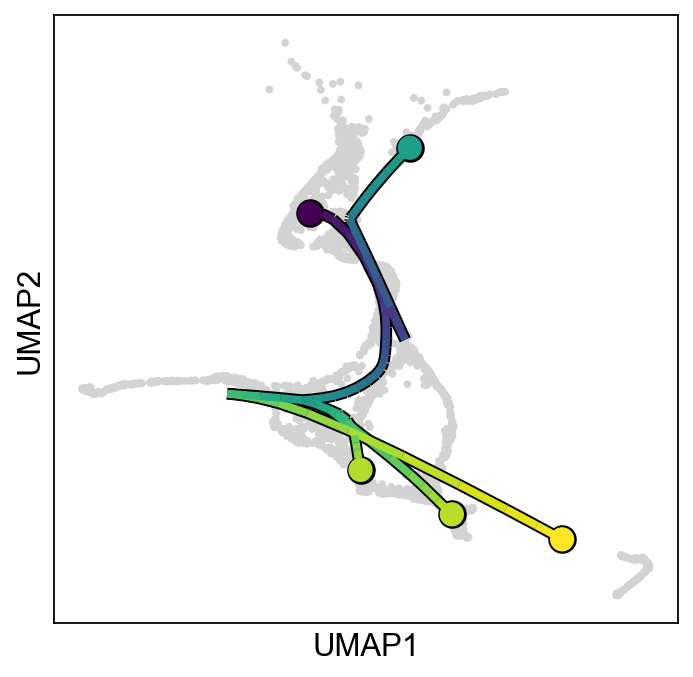

In [17]:
scf.pl.trajectory(adata_nogut,scale_path=0.7,save="_cosine_velo_pseudo.png")

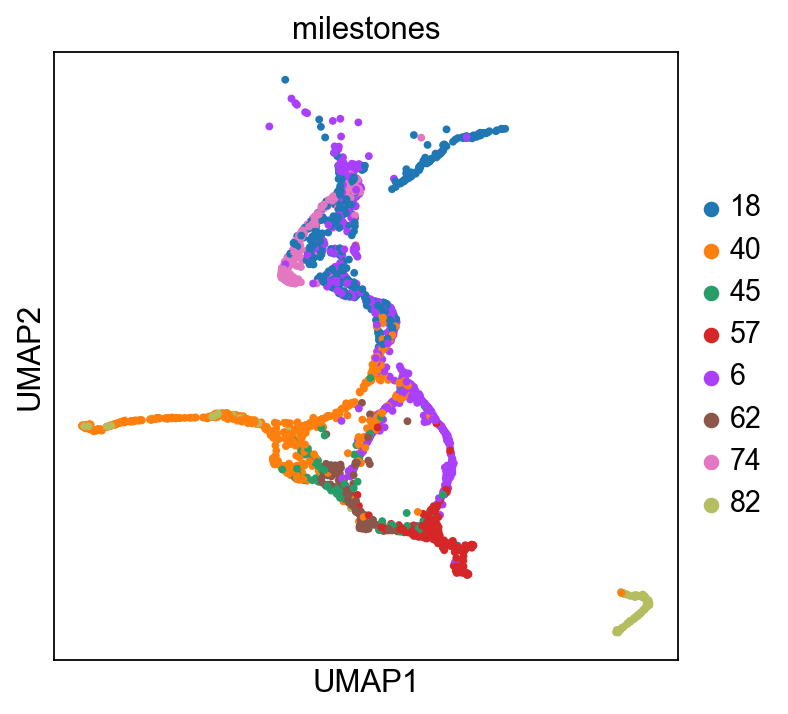

In [18]:
sc.pl.umap(adata_nogut,color="milestones")


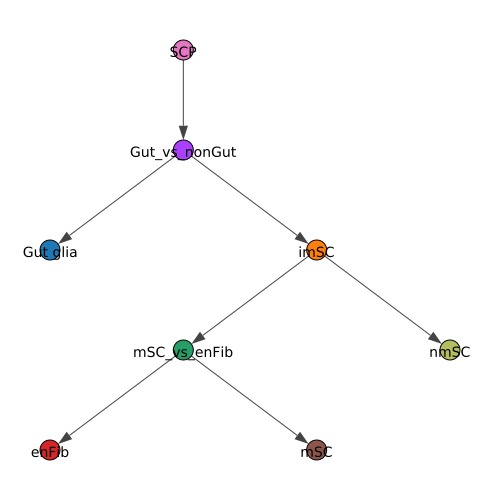

In [20]:
scf.tl.rename_milestones(adata_nogut,["Gut glia","imSC","mSC_vs_enFib","enFib","Gut_vs_nonGut","mSC","SCP","nmSC"])


scf.pl.milestones(adata_nogut)

In [25]:
endpoints=["nmSC 2","mSC","enFib"]
newcol=dict(zip(endpoints,list(map(lambda end: adata.uns["leiden_colors"][adata.obs.leiden.cat.categories==end][0],endpoints))))

endpoints=["nmSC","mSC","enFib"]
newcol=dict(zip(endpoints,list(newcol.values())))

adata_nogut.uns["milestones_colors"]=np.array(adata_nogut.uns["milestones_colors"])

for end in endpoints:
    adata_nogut.uns["milestones_colors"][adata_nogut.obs.milestones.cat.categories==end]=newcol[end]

adata_nogut.uns["milestones_colors"]=adata_nogut.uns["milestones_colors"].tolist()

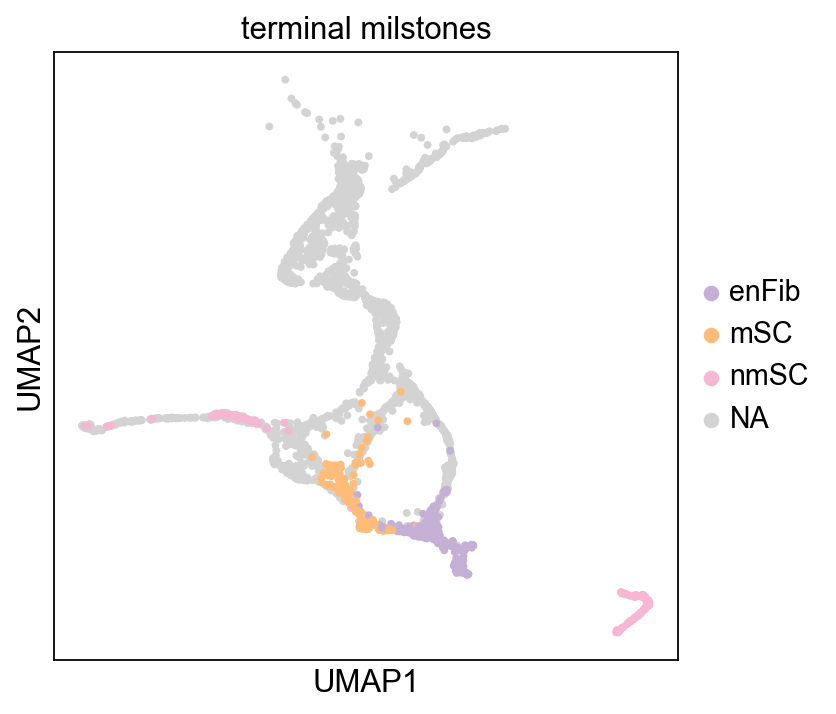

In [26]:
sc.pl.umap(adata_nogut,color="milestones",groups=["nmSC","mSC","enFib"],title="terminal milstones",
          save="_terminal_milestones.png")

In [27]:
adata_fpm=sc.read("adata_fpm.h5ad")

In [28]:
adata_fpm_nogut=adata_fpm[adata_nogut.obs_names]

In [29]:
adata_fpm_nogut.uns=adata_nogut.uns
adata_fpm_nogut.obs=adata_nogut.obs
adata_fpm_nogut.obsm=adata_nogut.obsm

In [30]:
sc.pp.filter_genes(adata_fpm_nogut,min_cells=5)

In [31]:
adata_fpm_nogut

AnnData object with n_obs × n_vars = 2416 × 18903
    obs: 'timeloc', 'batch', 'leiden', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'CytoTRACE', 't', 'seg', 'edge', 'milestones'
    var: 'n_cells'
    uns: 'leiden_colors', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'graph', 'ppt', 'pseudotime_list', 'milestones_colors'
    obsm: 'X_diffusion', 'X_umap'

In [32]:
scf.tl.test_association(adata_fpm_nogut,n_jobs=40)

test features for association with the trajectory
    mapping 0: 100%|██████████| 18903/18903 [02:42<00:00, 116.18it/s]
    found 8760 significant features (0:02:43) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significant.
    .var['A'] amplitue of change of tested feature.
    .var['signi'] feature is significantly changing along pseudotime.
    .uns['stat_assoc_list'] list of fitted features on the graph for all mappings.


In [34]:
scf.tl.fit(adata_fpm_nogut,n_jobs=40)

fit features associated with the trajectory
    mapping 0: 100%|██████████| 8760/8760 [02:05<00:00, 69.79it/s]
    finished (adata subsetted to keep only fitted features!) (0:02:15) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.


In [35]:
scf.tl.test_fork(adata_fpm_nogut,root_milestone="SCP",milestones=["nmSC","mSC","enFib"],n_jobs=40,rescale=True)

testing fork
    mapping: 0
    differential expression: 100%|██████████| 8760/8760 [00:50<00:00, 174.90it/s]
    test for upregulation for each leave vs root
    leave enFib: 100%|██████████| 2619/2619 [00:11<00:00, 230.77it/s]
    finished (0:01:23) --> added 
    .uns['SCP->nmSC<>mSC<>enFib']['fork'], DataFrame with fork test results.


In [36]:
scf.tl.branch_specific(adata_fpm_nogut,root_milestone="SCP",milestones=["nmSC","mSC","enFib"],effect=0.3)

    branch specific features: mSC: 227, nmSC: 102, enFib: 82
    finished --> updated 
    .uns['SCP->nmSC<>mSC<>enFib']['fork'], DataFrame updated with additionnal 'branch' column.


In [119]:
scf.tl.activation(adata_fpm_nogut,root_milestone="SCP",milestones=["nmSC","mSC","enFib"],pseudotime_offset=5,n_jobs=20,nwin=20)

testing activation
    leave enFib: 100%|██████████| 82/82 [00:00<00:00, 117.14it/s]
    threshold pseudotime is: 694.0267763155911
    39 early and 63 late features specific to leave nmSC
    142 early and 85 late features specific to leave mSC
    3 early and 79 late features specific to leave enFib
    finished (0:00:20) --> updated 
    .uns['SCP->nmSC<>mSC<>enFib']['fork'], DataFrame updated with additionnal 'activation' and 'module' columns.


In [120]:
df=adata_fpm_nogut.uns['SCP->nmSC<>mSC<>enFib']['fork']

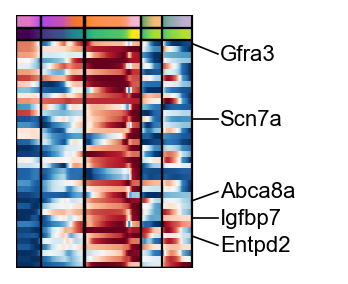

In [121]:
scf.pl.trends(adata_fpm_nogut,features=df.index[(df.module=="early") & (df.branch=="nmSC")],fig_heigth=2,n_features=5,
              root_milestone="SCP",milestones=["nmSC","mSC","enFib"],plot_emb=False,annot='milestones',fontsize=10,
                    filter_complex=False,ordering="pearson",show=False,heatmap_space=.2)

fig = plt.gcf()
fig.set_size_inches(2.5, 2)
fig.savefig('figures/trends_early_nmSC.svg')

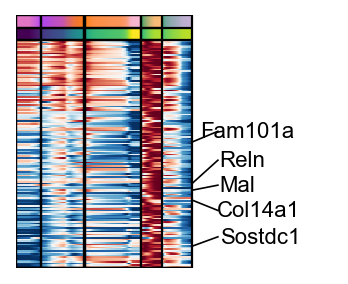

In [122]:
scf.pl.trends(adata_fpm_nogut,features=df.index[(df.module=="early") & (df.branch=="mSC")],fig_heigth=2,n_features=5,
              root_milestone="SCP",milestones=["nmSC","mSC","enFib"],plot_emb=False,annot='milestones',fontsize=10,
                    filter_complex=False,ordering="pearson",show=False,heatmap_space=.2)

fig = plt.gcf()
fig.set_size_inches(2.5, 2)
fig.savefig('figures/trends_early_mSC.svg')

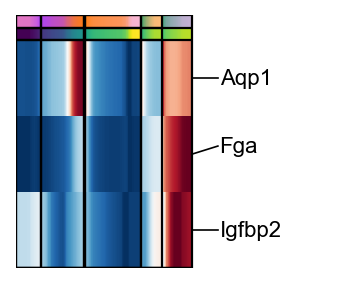

In [123]:
scf.pl.trends(adata_fpm_nogut,features=df.index[(df.module=="early") & (df.branch=="enFib")],fig_heigth=2,n_features=5,
              root_milestone="SCP",milestones=["nmSC","mSC","enFib"],plot_emb=False,annot='milestones',fontsize=10,
                    filter_complex=False,ordering="pearson",show=False,heatmap_space=.2)

fig = plt.gcf()
fig.set_size_inches(2.5, 2)
fig.savefig('figures/trends_early_enFib.svg')

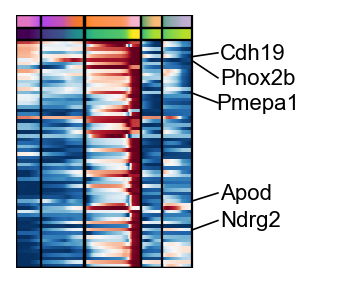

In [124]:
scf.pl.trends(adata_fpm_nogut,features=df.index[(df.module=="late") & (df.branch=="nmSC")],fig_heigth=2,n_features=5,
              root_milestone="SCP",milestones=["nmSC","mSC","enFib"],plot_emb=False,annot='milestones',fontsize=10,
                    filter_complex=False,ordering="pearson",show=False,heatmap_space=.2)

fig = plt.gcf()
fig.set_size_inches(2.5, 2)
fig.savefig('figures/trends_late_nmSC.svg')

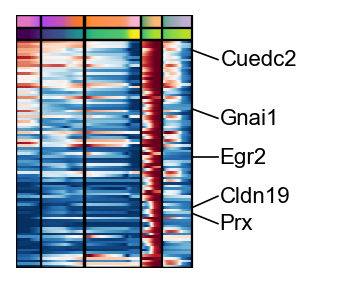

In [125]:
scf.pl.trends(adata_fpm_nogut,features=df.index[(df.module=="late") & (df.branch=="mSC")],fig_heigth=2,n_features=5,
              root_milestone="SCP",milestones=["nmSC","mSC","enFib"],plot_emb=False,annot='milestones',fontsize=10,
                    filter_complex=False,ordering="pearson",show=False,heatmap_space=.2)

fig = plt.gcf()
fig.set_size_inches(2.5, 2)
fig.savefig('figures/trends_late_mSC.svg')

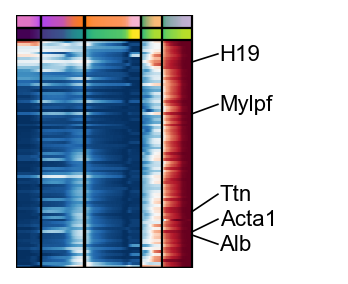

In [126]:
scf.pl.trends(adata_fpm_nogut,features=df.index[(df.module=="late") & (df.branch=="enFib")],fig_heigth=2,n_features=5,
              root_milestone="SCP",milestones=["nmSC","mSC","enFib"],plot_emb=False,annot='milestones',fontsize=10,
                    filter_complex=False,ordering="pearson",show=False,heatmap_space=.2)

fig = plt.gcf()
fig.set_size_inches(2.5, 2)
fig.savefig('figures/trends_late_enFib.svg')

In [54]:
import cellrank as cr
cr.tl.terminal_states(adata, cluster_key='leiden', weight_connectivities=0.5,n_states=5)

  0%|          | 0/2624 [00:00<?, ?cell/s]

  0%|          | 0/2624 [00:00<?, ?cell/s]

In [55]:
import matplotlib.pyplot as plt

saving figure to file ./figures/scvelo_absorptions.png


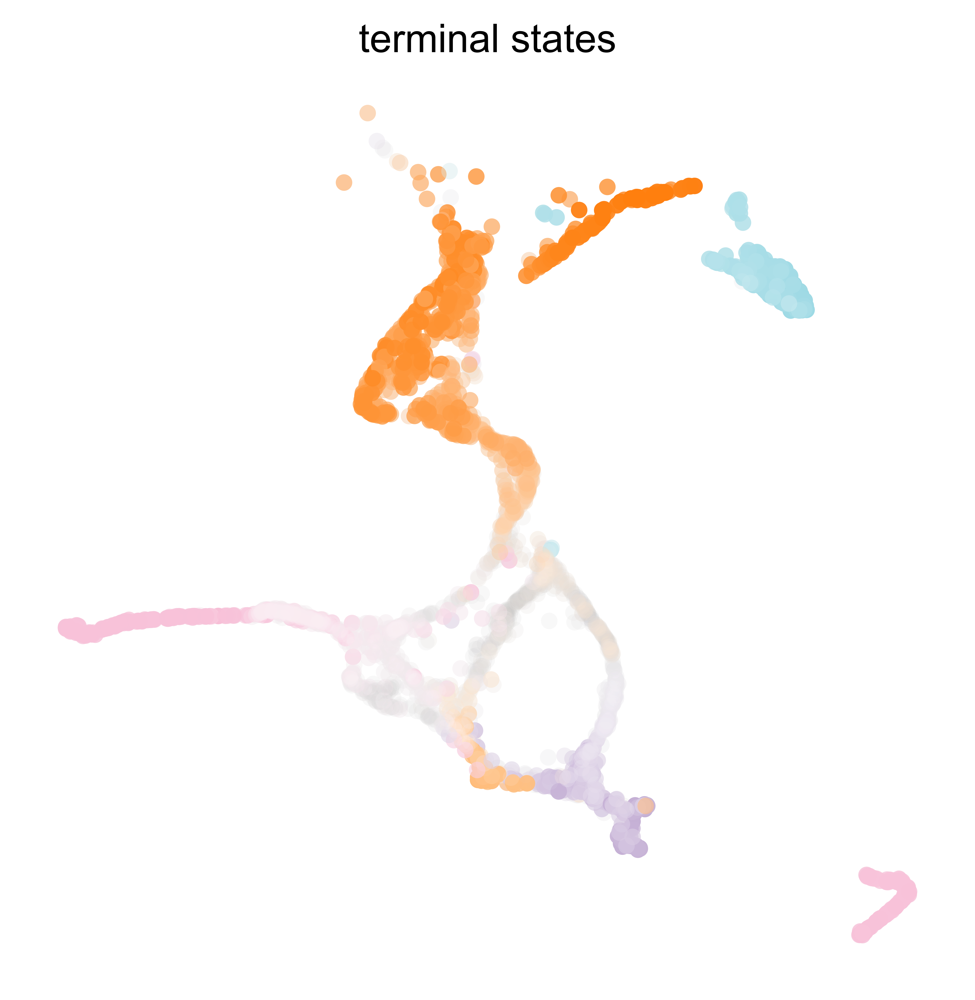

In [56]:
scv.set_figure_params(figsize=(5,5))
cr.pl.terminal_states(adata,dpi=600,save="absorptions.png",legend_loc="none",size=100)

saving figure to file ./figures/scvelo_terminal_states.png


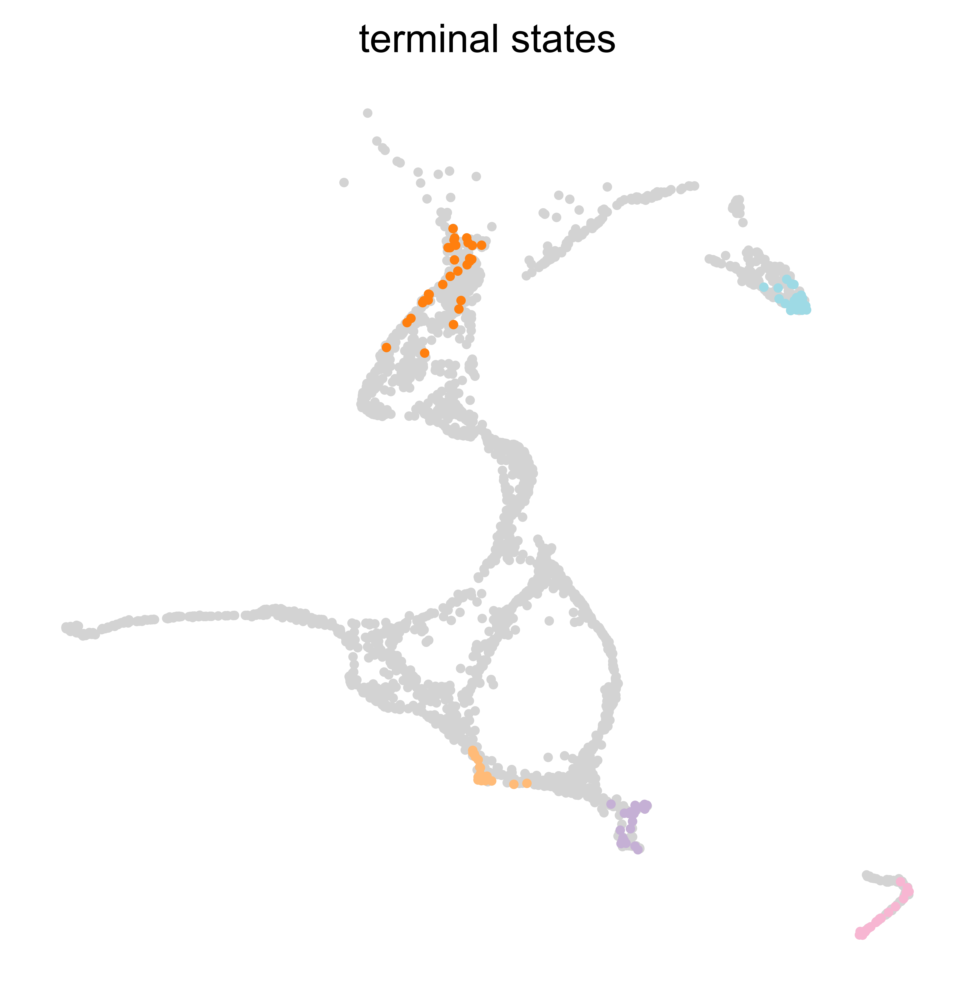

In [57]:
cr.pl.terminal_states(adata,discrete=True,save="terminal_states.png",dpi=600,legend_loc="none")

In [58]:
cr.tl.lineages(adata)
cr.pl.lineages(adata, same_plot=False,save="lineages.png",dpi=600)

saving figure to file ./figures/scvelo_lineages.png


In [59]:
adata.obs.to_terminal_states_dp=-adata.obs.to_terminal_states_dp

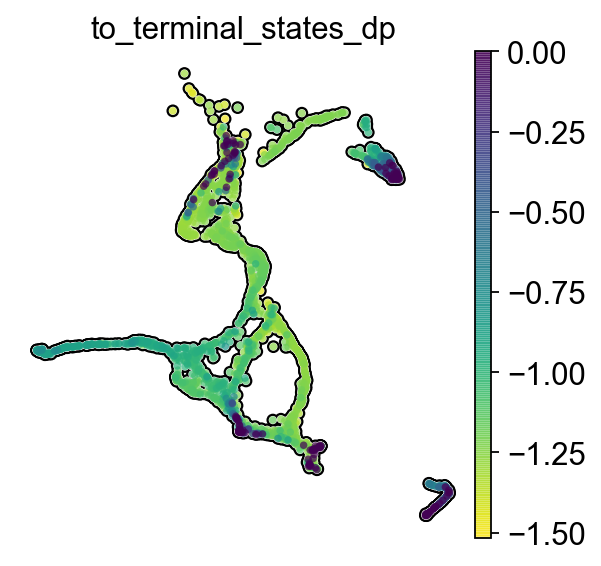

In [60]:
sc.set_figure_params(dpi_save=600,frameon=False)
sc.pl.umap(adata,color="to_terminal_states_dp",cmap="viridis_r",add_outline=True,frameon=False,save="_diff_pot.png")

In [61]:
adata_fpm=sc.read("adata_fpm.h5ad")

In [62]:
adata_fpm=adata_fpm[adata.obs_names]

In [63]:
adata_fpm.obs = adata.obs
adata_fpm.obsm = adata.obsm
adata_fpm.uns = adata.uns

In [64]:
sc.pp.filter_genes(adata_fpm, min_cells=3)

In [65]:
cr.tl.lineage_drivers(adata_fpm)

,mSC corr,mSC pval,mSC qval,mSC ci low,mSC ci high,enFib corr,enFib pval,enFib qval,enFib ci low,enFib ci high,...,nmSC 2 corr,nmSC 2 pval,nmSC 2 qval,nmSC 2 ci low,nmSC 2 ci high,Migratory SCP 1 corr,Migratory SCP 1 pval,Migratory SCP 1 qval,Migratory SCP 1 ci low,Migratory SCP 1 ci high
Cldn19,0.558644,7.628324e-229,1.499805e-224,0.531746,0.584416,-0.023639,2.261140e-01,3.450502e-01,-0.061848,0.014640,...,-0.246214,6.683444e-38,2.939669e-36,-0.281824,-0.209927,-0.102748,1.299821e-07,1.068386e-06,-0.140461,-0.064737
Nid2,0.530215,1.009099e-200,9.919946e-197,0.502138,0.557176,0.014216,4.667131e-01,6.016663e-01,-0.024062,0.052452,...,0.055509,4.444658e-03,1.273669e-02,0.017281,0.093575,-0.075481,1.080923e-04,5.417722e-04,-0.113419,-0.037324
Col1a1,0.504359,1.127147e-177,7.386947e-174,0.475266,0.532350,0.306228,5.279223e-59,6.252699e-57,0.271140,0.340503,...,-0.123910,1.812467e-10,1.474345e-09,-0.161410,-0.086053,-0.237012,3.837248e-35,9.200503e-33,-0.272803,-0.200566
Fa2h,0.502399,5.114189e-176,2.513752e-172,0.473232,0.530467,-0.051807,7.938783e-03,2.080848e-02,-0.089894,-0.013569,...,-0.247166,3.409732e-38,1.509882e-36,-0.282757,-0.210895,-0.037202,5.671753e-02,1.365903e-01,-0.075360,0.001064
Prx,0.501142,5.825160e-175,2.290569e-171,0.471927,0.529258,0.052232,7.439577e-03,1.968480e-02,0.013995,0.090317,...,-0.183668,1.889315e-21,3.322525e-20,-0.220384,-0.146432,-0.113563,5.248178e-09,5.343574e-08,-0.151171,-0.075626
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Phox2b,-0.316516,3.392981e-63,4.664992e-61,-0.350536,-0.281662,-0.228865,8.441685e-33,4.675267e-31,-0.264811,-0.192284,...,-0.115273,3.069876e-09,2.210063e-08,-0.152864,-0.077349,-0.048266,1.340031e-02,4.050168e-02,-0.086372,-0.010020
Crtac1,-0.325026,8.465131e-67,1.422504e-64,-0.358829,-0.290373,-0.204462,2.479226e-26,9.595288e-25,-0.240842,-0.167507,...,-0.091482,2.645204e-06,1.336607e-05,-0.129294,-0.053404,-0.043488,2.589249e-02,7.117901e-02,-0.081618,-0.005232
Fabp7,-0.366213,4.623116e-86,1.398386e-83,-0.398889,-0.332609,-0.329917,6.321167e-69,9.005831e-67,-0.363592,-0.295381,...,0.112719,6.817332e-09,4.729554e-08,0.074777,0.150336,0.189476,9.328047e-23,5.785449e-21,0.152315,0.226101
Hand2,-0.433060,1.488450e-124,9.754803e-122,-0.463642,-0.401447,-0.248062,1.803685e-38,1.194015e-36,-0.283635,-0.211808,...,-0.021450,2.720640e-01,4.086988e-01,-0.059666,0.016829,-0.064481,9.472333e-04,3.889631e-03,-0.102493,-0.026281


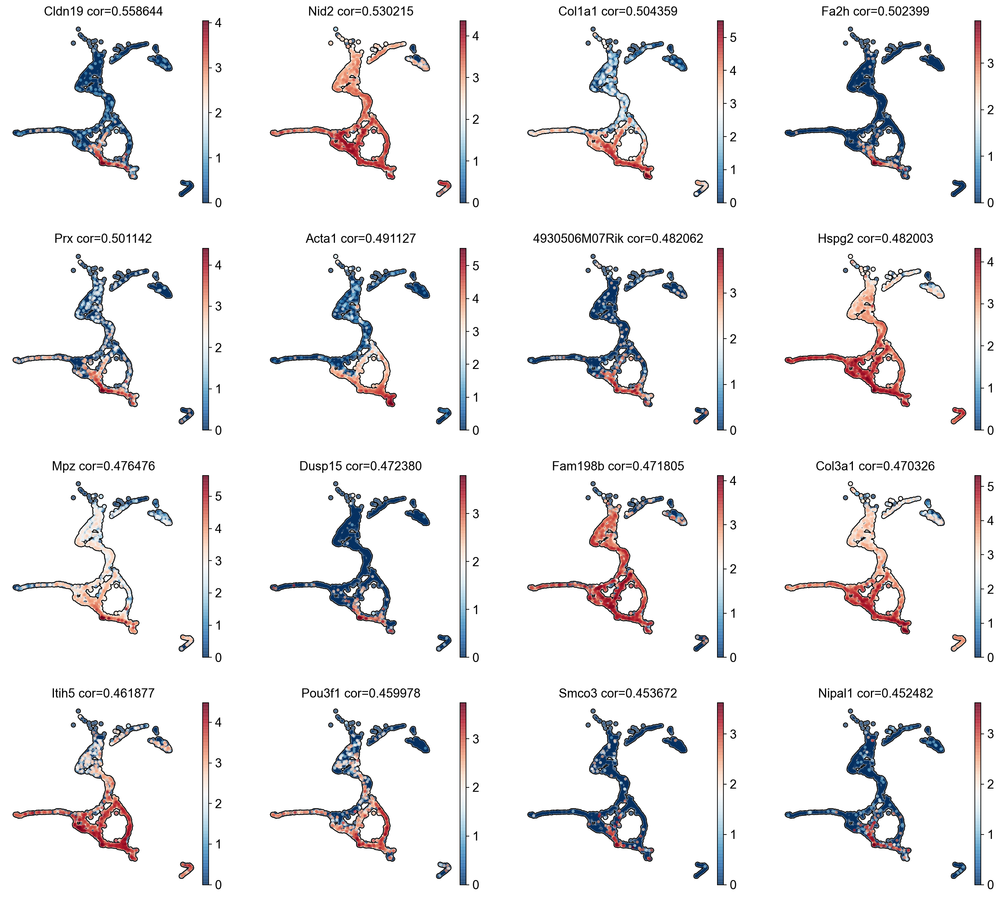

In [66]:
sc.pl.umap(adata_fpm,color=adata_fpm.var["to mSC corr"].sort_values(ascending=False)[:16].index,frameon=False,add_outline=True,
           title=["{} cor={:0=2f}".format(a_, b_) for a_,b_ in zip(adata_fpm.var["to mSC corr"].sort_values(ascending=False)[:16].index.to_list(),
                                                                   adata_fpm.var["to mSC corr"].sort_values(ascending=False)[:16].to_list())],
          save="_mSC_lineage_drivers.png")


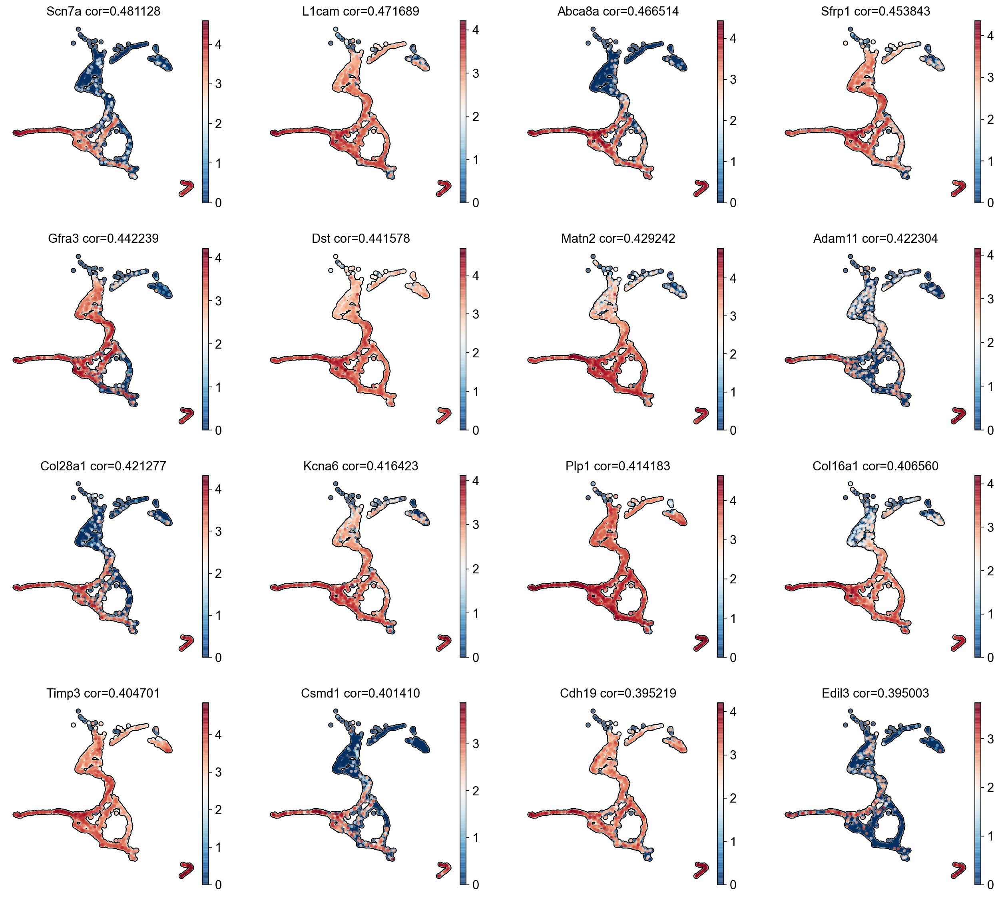

In [67]:
sc.pl.umap(adata_fpm,color=adata_fpm.var["to nmSC 2 corr"].sort_values(ascending=False)[:16].index,frameon=False,add_outline=True,
           title=["{} cor={:0=2f}".format(a_, b_) for a_,b_ in zip(adata_fpm.var["to nmSC 2 corr"].sort_values(ascending=False)[:16].index.to_list(),
                                                                   adata_fpm.var["to nmSC 2 corr"].sort_values(ascending=False)[:16].to_list())],
           save="_nmSC_lineage_drivers.png")

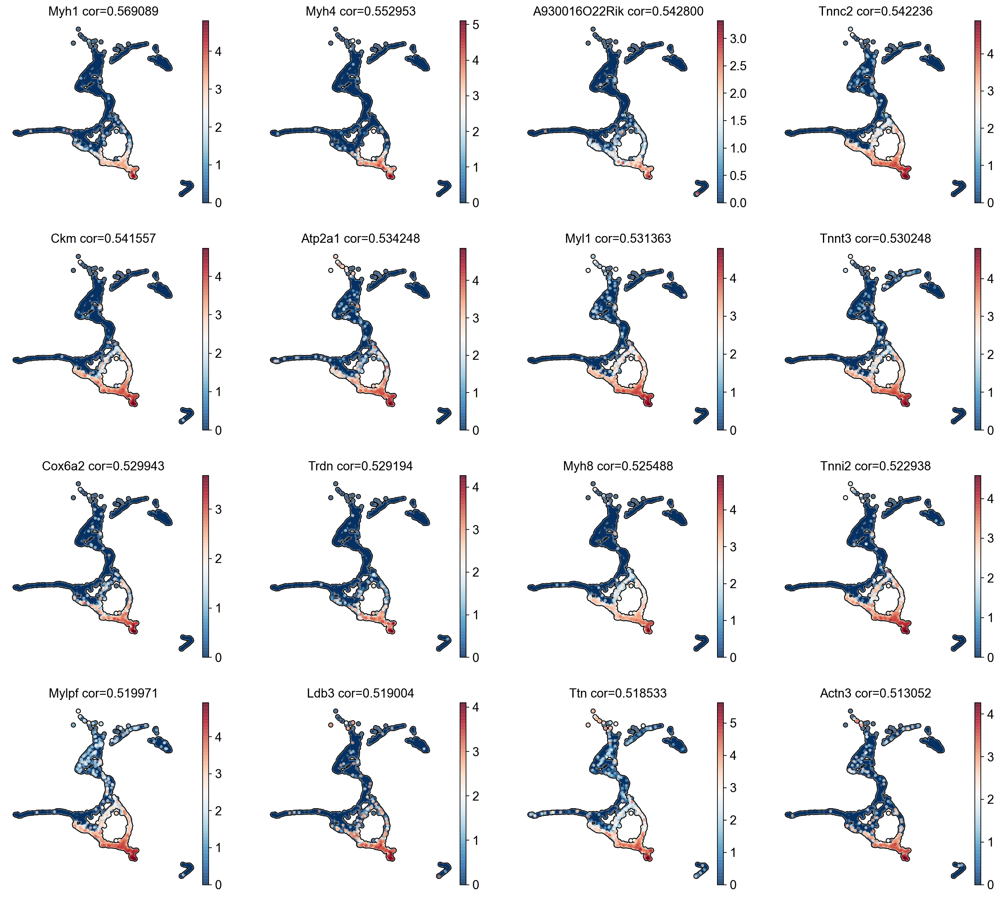

In [68]:
sc.pl.umap(adata_fpm,color=adata_fpm.var["to enFib corr"].sort_values(ascending=False)[:16].index,frameon=False,add_outline=True,
           title=["{} cor={:0=2f}".format(a_, b_) for a_,b_ in zip(adata_fpm.var["to enFib corr"].sort_values(ascending=False)[:16].index.to_list(),
                                                                   adata_fpm.var["to enFib corr"].sort_values(ascending=False)[:16].to_list())],
          save="_enFib_lineage_drivers.png")

In [69]:
df.branch.value_counts()

mSC      227
nmSC     102
enFib     82
Name: branch, dtype: int64

In [70]:
adata_fpm.var["to enFib corr"]

Adora1    0.123188
Sntg1     0.044824
Prim2    -0.055697
Bai3     -0.047259
Cflar     0.013406
            ...   
Prdx3    -0.084868
Sfxn4    -0.059365
Gm7102   -0.062862
Csf2ra   -0.094508
eGFP     -0.047941
Name: to enFib corr, Length: 19661, dtype: float64

In [71]:
enFib=adata_fpm.var["to enFib corr"].sort_values()
enFib=pd.DataFrame({'cors':enFib.values,'bifurcation':False},index=enFib.index)
hit=df.loc[df.branch=='enFib',:].index[df.loc[df.branch=='enFib',:].index.isin(enFib.index)]
enFib.loc[hit,"bifurcation"]=True

In [72]:
enFib.bifurcation.sum()

82

In [73]:
nmSC=adata_fpm.var["to nmSC 2 corr"].sort_values()
nmSC=pd.DataFrame({'cors':nmSC.values,'bifurcation':False},index=nmSC.index)
hit=df.loc[df.branch=='nmSC',:].index[df.loc[df.branch=='nmSC',:].index.isin(nmSC.index)]
nmSC.loc[hit,"bifurcation"]=True

In [74]:
nmSC.bifurcation.sum()

102

In [75]:
mSC=adata_fpm.var["to mSC corr"].sort_values()
mSC=pd.DataFrame({'cors':mSC.values,'bifurcation':False},index=mSC.index)
hit=df.loc[df.branch=='mSC',:].index[df.loc[df.branch=='mSC',:].index.isin(mSC.index)]
mSC.loc[hit,"bifurcation"]=True

In [76]:
mSC.bifurcation.sum()

227

In [77]:
enFib["rank"]=np.arange(1,enFib.shape[0]+1)
nmSC["rank"]=np.arange(1,nmSC.shape[0]+1)
mSC["rank"]=np.arange(1,mSC.shape[0]+1)

In [78]:
enFib=enFib.loc[enFib.bifurcation.sort_values(ascending=True).index]
nmSC=nmSC.loc[nmSC.bifurcation.sort_values(ascending=True).index]
mSC=mSC.loc[mSC.bifurcation.sort_values(ascending=True).index]

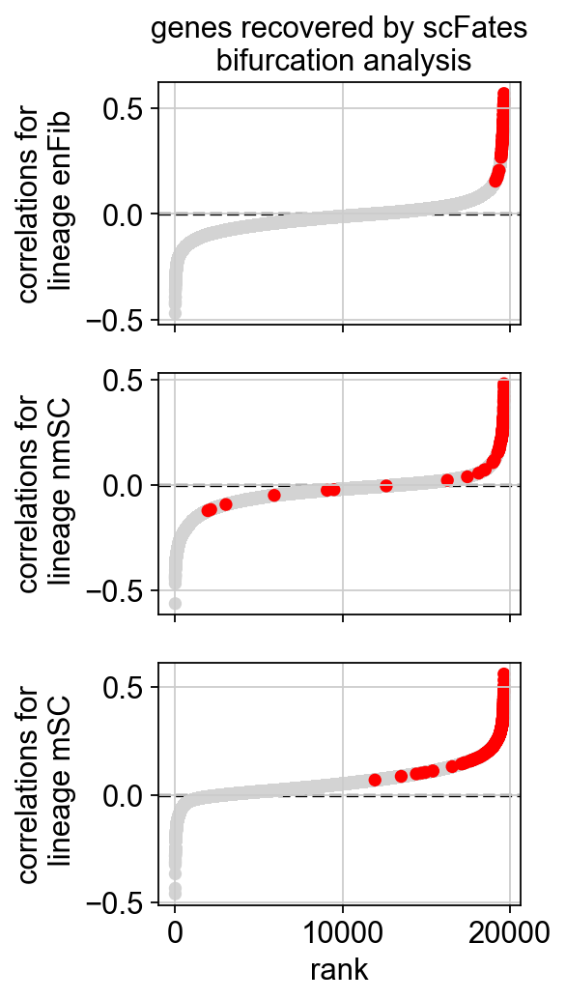

In [98]:
import seaborn as sns

f, axarr = plt.subplots(3, sharex=True,figsize=(3,7))

sns.scatterplot(data=enFib, x="rank",y="cors",hue="bifurcation",c="k",linewidth=0,rasterized=True,
                palette=["lightgrey","red"],ax=axarr[0],legend=False)
axarr[0].set_ylabel("correlations for\n lineage enFib")
axarr[0].axhline(y=0,color="k",linestyle="dashed",zorder=-1)
axarr[0].set_title('genes recovered by scFates\n bifurcation analysis')

sns.scatterplot(data=nmSC, x="rank",y="cors",hue="bifurcation",c="k",linewidth=0,rasterized=True,
                palette=["lightgrey","red"],ax=axarr[1],legend=False)
axarr[1].set_ylabel("correlations for\n lineage nmSC")
axarr[1].axhline(y=0,color="k",linestyle="dashed",zorder=-1)
axarr[1].set_title('')

sns.scatterplot(data=mSC, x="rank",y="cors",hue="bifurcation",c="k",linewidth=0,rasterized=True,
                palette=["lightgrey","red"],ax=axarr[2],legend=False)
axarr[2].set_ylabel("correlations for\n lineage mSC")
axarr[2].axhline(y=0,color="k",linestyle="dashed",zorder=-1)
axarr[2].set_title('')

plt.savefig("figures/bif_vs_cellrank_genes.svg",dpi=600)